<img src='https://www.actris.eu/sites/default/files/inline-images/Actris%20logo.png' width=200 align=right>

# ACTRIS DC 
## Access ACTRIS ARES data

# OBS THIS DOES NOT WORK RIGHT NOW, UPDATES ARE NEEDED FOR ACTRIS REST API


## Getting Earlinet data
For Earlinet, you should be able to use the ACTRIS api to fetch all the dataset urls. At least for all Earlinet data labeled as ACTRIS.

NB! Due to work on the API, there are currently no data available for ARES.


### GRES database
Provider ID 10 is the ARES unit, what you refer to as the Earlinet database 

In [1]:
# import packages
import pandas as pd
import numpy as np 
import requests
import json
import netCDF4 as nc
import xarray as xr

In [2]:
response = requests.get('https://prod-actris-md.nilu.no/Providers/10')
provider_10 = response.json()
provider_10 

[{'id': 10,
  'name': 'ARES',
  'acronym': 'ARES',
  'description': 'ACTRIS Aerosol remote sensing data centre unit (ARES)',
  'created': '2020-06-29T07:05:07.4936990Z'}]

### Getting all Earlinet data
Using the API call below you will get a list of all the datasets with metadata. Fetching the "dataset_url" you should be able to download all the files.

In [3]:
response = requests.get("https://prod-actris-md.nilu.no/Metadata/provider/10") # API call
earlinet_archive = response.json()

In [4]:
earlinet_archive

[{'md_metadata': {'id': 261376,
   'provider': {'name': 'ARES', 'atom': 'http://localhost:5009/providers/10'},
   'file_identifier': 'EARLINET_AerRemSen_dus_Lev01_b0532_202408131200_202408131300_v01_qc03.nc',
   'language': 'en',
   'hierarchy_level': 'dataset',
   'online_resource': {'linkage': 'https://data.earlinet.org/'},
   'datestamp': '2024-08-14T02:03:00.0000000Z',
   'created': '2024-08-14T13:02:33.0000000Z',
   'contact': [{'first_name': 'Lucia',
     'last_name': 'Mona',
     'organisation_name': 'CNR-IMAA',
     'role_code': ['custodian',
      'distributor',
      'pointOfContact',
      'processor',
      'publisher',
      'resourceProvider'],
     'country_code': 'IT',
     'delivery_point': 'Contrada S.Loja, Zona Industriale - Tito Scalo I-85050 Potenza',
     'address_city': 'Potenza',
     'email': 'lucia.mona@cnr.it',
     'position_name': 'Senior Researcher'}]},
  'md_identification': {'abstract': 'Profiles of aerosol optical properties',
   'title': 'Aerosol parti

### All available variables
If you want to list out all the relevant datasets for a give extinction variable you can look at available variables in ACTRIS here (soon it will change following the new ACTRIS vocabulary https://vocabulary.actris.nilu.no/): 

In [13]:
response = requests.get('https://prod-actris-md.nilu.no/Vocabulary/contentattribute')
contenst = response.json()
contenst

[{'label': '1,1,1,2,2,3,4,5,5,5-decafluoropentane amount fraction',
  'atom': 'https://vocabulary.actris.nilu.no/actris_vocab/1-1-1-2-2-3-4-5-5-5-decafluoropentaneamountfraction'},
 {'label': '1,1,1,2,2,3,4,5,5,5-decafluoropentane mass concentration',
  'atom': 'https://vocabulary.actris.nilu.no/actris_vocab/1-1-1-2-2-3-4-5-5-5-decafluoropentanemassconcentration'},
 {'label': '1,1,1,2,2,3,4,5,5,5-decafluoropentane number concentration',
  'atom': 'https://vocabulary.actris.nilu.no/actris_vocab/1-1-1-2-2-3-4-5-5-5-decafluoropentanenumberconcentration'},
 {'label': '1,1,1,2,3,3,3-heptafluoropropane amount fraction',
  'atom': 'https://vocabulary.actris.nilu.no/actris_vocab/1-1-1-2-3-3-3-heptafluoropropaneamountfraction'},
 {'label': '1,1,1,2,3,3,3-heptafluoropropane mass concentration',
  'atom': 'https://vocabulary.actris.nilu.no/actris_vocab/1-1-1-2-3-3-3-heptafluoropropanemassconcentration'},
 {'label': '1,1,1,2,3,3,3-heptafluoropropane number concentration',
  'atom': 'https://vocabu

### Spesific requests for all Earlinet extinction profiles
Here are the specific requests for all the Earlinet exinction profiles

In [15]:
response = requests.get('https://prod-actris-md.nilu.no/Metadata/content/aerosol particle light extinction coefficient')
aec_archive = response.json()
aec_archive

[{'md_metadata': {'id': 243166,
   'provider': {'name': 'ARES', 'atom': 'http://localhost:5009/providers/10'},
   'file_identifier': 'EARLINET_AerRemSen_jfj_Lev02_b0532_200012041200_200012041230_v01_qc00.nc',
   'language': 'en',
   'hierarchy_level': 'dataset',
   'online_resource': {'linkage': 'https://data.earlinet.org/'},
   'datestamp': '2019-06-15T20:16:00.0000000Z',
   'created': '2024-06-15T08:41:36.0000000Z',
   'contact': [{'first_name': 'Lucia',
     'last_name': 'Mona',
     'organisation_name': 'CNR-IMAA',
     'role_code': ['custodian',
      'distributor',
      'pointOfContact',
      'processor',
      'publisher',
      'resourceProvider'],
     'country_code': 'IT',
     'delivery_point': 'Contrada S.Loja, Zona Industriale - Tito Scalo I-85050 Potenza',
     'address_city': 'Potenza',
     'email': 'lucia.mona@cnr.it',
     'position_name': 'Senior Researcher'}]},
  'md_identification': {'abstract': 'Profiles of aerosol optical properties',
   'title': 'Aerosol parti

In [16]:
response = requests.get('https://prod-actris-md.nilu.no/Metadata/content/aerosol particle light extinction to backscatter ratio')
aebr_archive = response.json()
aebr_archive

[{'md_metadata': {'id': 93060,
   'provider': {'name': 'ARES', 'atom': 'http://localhost:5009/providers/10'},
   'file_identifier': 'EARLINET_AerRemSen_gra_Lev01_e0355_202311250030_202311250129_v01_qc03.nc',
   'language': 'en',
   'hierarchy_level': 'dataset',
   'online_resource': {'linkage': 'https://data.earlinet.org/'},
   'datestamp': '2024-03-04T02:04:00.0000000Z',
   'created': '2024-06-11T11:04:13.0000000Z',
   'contact': [{'first_name': 'Lucia',
     'last_name': 'Mona',
     'organisation_name': 'CNR-IMAA',
     'role_code': ['custodian',
      'distributor',
      'pointOfContact',
      'processor',
      'publisher',
      'resourceProvider'],
     'country_code': 'IT',
     'delivery_point': 'Contrada S.Loja, Zona Industriale - Tito Scalo I-85050 Potenza',
     'address_city': 'Potenza',
     'email': 'lucia.mona@cnr.it',
     'position_name': 'Senior Researcher'}]},
  'md_identification': {'abstract': 'Profiles of aerosol optical properties',
   'title': 'Aerosol partic

### Getting dataset_url

In [17]:
files_list = []
for f in aebr_archive: # Choose your prefered archive
    url = f['md_distribution_information'][0]['dataset_url']
    files_list.append(url)
files_list

['https://data.earlinet.org/api/services/restapi/opticalproducts/id/139600/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139601/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139604/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139605/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139610/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139609/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139614/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139615/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139619/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139620/downloads',
 'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139624/downloads',
 'https://data.earlinet.org/api/services/re

In [18]:
url = files_list[0]
url

'https://data.earlinet.org/api/services/restapi/opticalproducts/id/139600/downloads'

### Get NetCDF4 or xarray files

Earlinet uses Basic Authentication on their data, thus you need to provide a username and a password to access the dataset through the url. If you do not have an user account, create one her: https://data.earlinet.org/

In [19]:
username = "lemu@nilu.no" # Change to your username for accessing Earlinet data
password = "LiseLise" # Your password for accessing Earlinet data 

r = requests.get(url, auth=(username, password)).content
ds = nc.Dataset('data', memory = r) 
ds

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.7
    title: Profiles of aerosol optical properties
    source: Ground based LIDAR measurements
    references: Project website at http://www.earlinet.org
    history: 2024-03-04T02:04Z : Assigned version 1
 2024-03-04T02:04:00Z : File uploaded on Earlinet database
 2024-03-03T20:51:06Z: elpp -d sccoperational -m 20231125gra0031 -c elpp.config; 2024-03-03T20:53:38Z: elda 20231125gra0031 -c elda.ini
    station_ID: gra
    location: Granada, Spain
    system: Alhambra
    institution: Andalusian Institute for Earth System Research, University of Granada(IISTA-CEAMA) - CEAMA
    comment: 
    measurement_ID: 20231125gra0031
    measurement_start_datetime: 2023-11-25T00:30:04Z
    measurement_stop_datetime: 2023-11-25T01:29:32Z
    PI: Lucas Alados-Arboledas
    PI_affiliation: Andalusian Institute for Earth System Research, University of Granada
    PI_affiliation_acronym: CEAMA
  

In [20]:
ds2 = xr.open_dataset(xr.backends.NetCDF4DataStore(ds)) #convert to xarray
ds2

<xarray.Dataset>
Dimensions:                                         (time: 1, nv: 2,
                                                     altitude: 2591,
                                                     wavelength: 1)
Coordinates:
  * time                                            (time) datetime64[ns] 202...
  * altitude                                        (altitude) float64 954.0 ...
  * wavelength                                      (wavelength) float32 355.0
    longitude                                       float32 ...
    latitude                                        float32 ...
Dimensions without coordinates: nv
Data variables: (12/31)
    time_bounds                                     (time, nv) datetime64[ns] ...
    backscatter_calibration_value                   (wavelength) float32 ...
    extinction_assumed_wavelength_dependence        (wavelength) float32 ...
    error_retrieval_method                          (wavelength) float32 ...
    backscatter_evaluation_method                   (wavelength) float32 ...
    backscatter_calibration_range_search_algorithm  (wavelength) float32 ...
    ...                                              ...
    user_defined_category                           float64 ...
    backscatter_calibration_range                   (wavelength, nv) float32 ...
    backscatter_calibration_search_range            (wavelength, nv) float32 ...
    cloud_mask_type                                 float32 ...
    scc_product_type                                float32 ...
    cloud_mask                                      (time, altitude) float32 ...
Attributes: (12/35)
    Conventions:                          CF-1.7
    title:                                Profiles of aerosol optical properties
    source:                               Ground based LIDAR measurements
    references:                           Project website at http://www.earli...
    history:                              2024-03-04T02:04Z : Assigned versio...
    station_ID:                           gra
    ...                                   ...
    scc_version_description:              SCC vers. 5.2.7 (HiRELPP vers. 1.1....
    processor_name:                       ELDA
    processor_version:                    3.4.8.1
    __file_format_version:                2.1
    input_file:                           gra_002_0002304_202311250030_202311...
    overlap_correction_file:

## Plot data with xarray/matplotlib

Text(0.5, 1.0, 'Wavelenght: 355.0 nm')

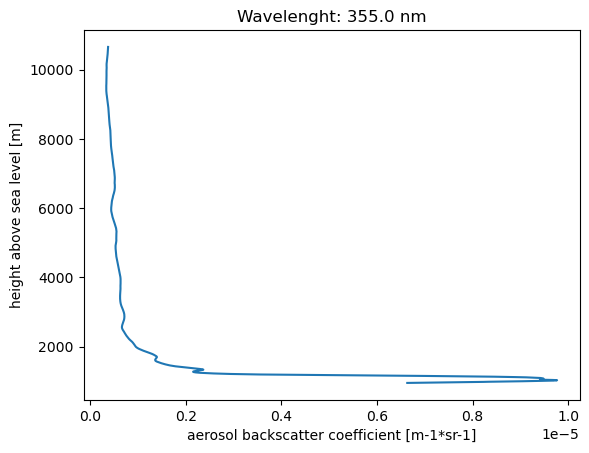

In [21]:
import matplotlib.pyplot as plt

indexes = np.where(ds2.backscatter.values[0][0]<=1e+36) # All values that are less than fill value for missing data

plt.figure()
plt.plot(ds2.backscatter.values[0][0][indexes],ds2.backscatter.altitude.values[indexes])
plt.ylabel('{} [{}]'.format(ds2.altitude.attrs['long_name'],ds2.altitude.attrs['units']))
plt.xlabel('{} [{}]'.format(ds2.backscatter.attrs['long_name'],ds2.backscatter.attrs['units']))
plt.title('Wavelenght: {} {}'.format(ds2.wavelength.values[0], ds2.wavelength.attrs['units']))

Text(0.5, 1.0, 'Wavelenght: 355.0 nm')

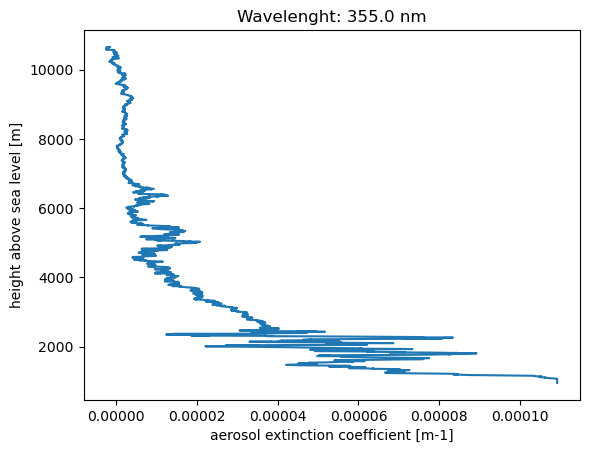

In [22]:
indexes = np.where(ds2.extinction.values[0][0]<=1e+36) # All values that are less than fill value for missing data

plt.figure()
plt.plot(ds2.extinction.values[0][0][indexes],ds2.altitude.values[indexes])
plt.ylabel('{} [{}]'.format(ds2.altitude.attrs['long_name'],ds2.altitude.attrs['units']))
plt.xlabel('{} [{}]'.format(ds2.extinction.attrs['long_name'],ds2.extinction.attrs['units']))
plt.title('Wavelenght: {} {}'.format(ds2.wavelength.values[0], ds2.wavelength.attrs['units']))